In [5]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
import os
import numpy as np
from PIL import Image
from zipfile import ZipFile
from natsort import natsorted


def convert_one_channel(img):
    #some images have 3 channels , although they are grayscale image
    if len(img.shape)>2:
        img=img[:,:,0]
        return img
    else:
        return img

def pre_images(resize_shape):

    path="/content/drive/MyDrive/Images"
    dirs=natsorted(os.listdir(path))
    sizes=np.zeros([len(dirs),2])
    images=Image.open(os.path.join(path, dirs[0]))
    sizes[0,:]=images.size
    images=(images.resize((resize_shape),Image.Resampling.LANCZOS))
    images=convert_one_channel(np.asarray(images))
    for i in range (1,len(dirs)):
        img=Image.open(os.path.join(path, dirs[i]))
        sizes[i,:]=img.size
        img=img.resize((resize_shape),Image.Resampling.LANCZOS)
        img=convert_one_channel(np.asarray(img))
        images=np.concatenate((images,img))
    images=np.reshape(images,(len(dirs),resize_shape[0],resize_shape[1],1))
    return images,sizes

In [10]:
X,X_sizes=pre_images((512,512))


In [11]:
import os
import sys
import numpy as np
from PIL import Image
from zipfile import ZipFile
from natsort import natsorted
script_dir=os.path.abspath(os.path.dirname(sys.argv[0]))
default_path=script_dir+'/Original_Masks/'

def convert_one_channel(img):
    #some images have 3 channels , although they are grayscale image
    if len(img.shape)>2:
        img=img[:,:,0]
        return img
    else:
        return img
def pre_masks(resize_shape=(512,512),path=default_path):
    ZipFile(path+"/Orig_Masks.zip").extractall(path+'/Masks/')
    path=path+'/Masks/'
    dirs=natsorted(os.listdir(path))
    masks=img=Image.open(path+dirs[0])
    masks=(masks.resize((resize_shape),Image.ANTIALIAS))
    masks=convert_one_channel(np.asarray(masks))
    for i in range (1,len(dirs)):
        img=Image.open(path+dirs[i])
        img=img.resize((resize_shape),Image.ANTIALIAS)
        img=convert_one_channel(np.asarray(img))
        masks=np.concatenate((masks,img))
    masks=np.reshape(masks,(len(dirs),resize_shape[0],resize_shape[1],1))
    return masks


default_path="/content/drive/MyDrive/splitted_masks"


#CustomMasks 512x512
def pre_splitted_masks():

    path="/content/drive/MyDrive/splitted_masks"
    dirs=natsorted(os.listdir(path))
    masks=img=Image.open(os.path.join(path, dirs[0]))
    masks=convert_one_channel(np.asarray(masks))
    for i in range (1,len(dirs)):
        img=Image.open(os.path.join(path, dirs[i]))
        img=convert_one_channel(np.asarray(img))
        masks=np.concatenate((masks,img))
    masks=np.reshape(masks,(len(dirs),512,512,1))
    return masks

In [12]:
#Y=pre_masks(resize_shape=(512,512),path='/content/Segmentation-of-Teeth-in-Panoramic-X-ray-Image/Original_Masks')  ORIGINALL MASKS function
Y=pre_splitted_masks() #Custom Splitted MASKS size 512x512

In [13]:
X=np.float32(X/255)
Y=np.float32(Y/255)


In [14]:
x_train=X[:105,:,:,:]
y_train=Y[:105,:,:,:]
x_test=X[105:,:,:,:]
y_test=Y[105:,:,:,:]

In [15]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-40r9sztk
  Running command git clone --filter=blob:none --quiet https://github.com/albu/albumentations /tmp/pip-req-build-40r9sztk
  Resolved https://github.com/albu/albumentations to commit b59030cb5a4d03ad57dca6ce4f985e0d9d8c0dd7
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [16]:

import cv2
import albumentations as A
#Augmention . Change what you want ! Care about Your GPU and CPU RAM

#If you get error : cannot import name '_registerMatType' from 'cv2.cv2' :
#!pip uninstall opencv-python-headless==4.5.5.62
#!pip install opencv-python-headless==4.5.2.52

aug = A.Compose([
    A.OneOf([A.RandomCrop(width=512, height=512),
                 A.PadIfNeeded(min_height=512, min_width=512, p=0.5)],p=0.4),
    A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25,p=0.5),
    A.Compose([A.RandomScale(scale_limit=(-0.15, 0.15), p=1, interpolation=1),
                            A.PadIfNeeded(512, 512, border_mode=cv2.BORDER_CONSTANT),
                            A.Resize(512, 512, cv2.INTER_NEAREST), ],p=0.5),
    A.ShiftScaleRotate (shift_limit=0.325, scale_limit=0.15, rotate_limit=15,border_mode=cv2.BORDER_CONSTANT, p=1),
    A.Rotate(15,p=0.5),
    A.Blur(blur_limit=1, p=0.5),
    A.Downscale(scale_min=0.15, scale_max=0.25,  always_apply=False, p=0.5),
    A.GaussNoise(var_limit=(0.05, 0.1), mean=0, per_channel=True, always_apply=False, p=0.5),
    A.HorizontalFlip(p=0.25),
])

x_train1=np.copy(x_train)
y_train1=np.copy(y_train)
count=0
while(count<4):
  x_aug2=np.copy(x_train1)
  y_aug2=np.copy(y_train1)
  for i in range(len(x_train1)):
    augmented=aug(image=x_train1[i,:,:,:],mask=y_train1[i,:,:,:])
    x_aug2[i,:,:,:]= augmented['image']
    y_aug2[i,:,:,:]= augmented['mask']
  x_train=np.concatenate((x_train,x_aug2))
  y_train=np.concatenate((y_train,y_aug2))
  if count == 9:
    break
  count += 1


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/usr/local/lib/python3.11/dist-packages/albumentations/augmentations/blur/functional.py:231: UserWarning: blur_limit: Invalid kernel size range (3, 1). Values less than 3 are not allowed. Range automatically adjusted to (3, 3).
  result = _ensure_min_value(result, min_value, info.field_name)
<ipython-input-16-20fa0e5df79c>:19: UserWarning: Argument(s) 'scale_min, scale_max, always_apply' are not valid for transform Downscale
  A.Downscale(scale_min=0.15, scale_max=0.25,  always_apply=False, p=0.5),
<ipython-input-16-20fa0e5df79c>:20: UserWarning: Argument(s) 'var_limit, mean, always_apply' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(0.05, 0.1), mean=0, per_channel=True, always_apply=False, p=0.5),


In [17]:
del x_aug2
del X
del Y
del y_aug2
del y_train1
del x_train1
del augmented


In [18]:
import random
import matplotlib.pyplot as plt
random_number=60
print(random_number)

60


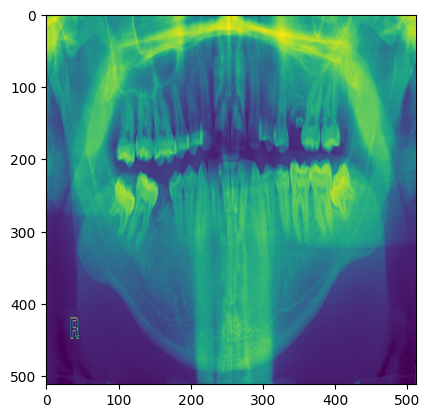

In [53]:
plt.imshow(x_train[1,:,:,0])

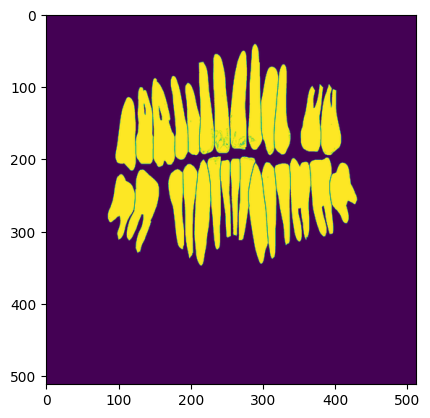

In [40]:
#Checking data X  and Y matching
plt.imshow(y_train[1,:,:,0])

In [21]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization,concatenate,Conv2DTranspose,Dropout
from tensorflow.keras.models import Model


def UNET (input_shape=(512,512,1),last_activation='sigmoid'):
    inputs=Input(shape=input_shape)

    conv1 = Conv2D(32,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    d1=Dropout(0.1)(conv1)
    conv2 = Conv2D(32,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d1)
    b=BatchNormalization()(conv2)

    pool1 = MaxPooling2D(pool_size=(2, 2))(b)
    conv3 = Conv2D(64,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    d2=Dropout(0.2)(conv3)
    conv4 = Conv2D(64,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d2)
    b1=BatchNormalization()(conv4)

    pool2 = MaxPooling2D(pool_size=(2, 2))(b1)
    conv5 = Conv2D(128,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    d3=Dropout(0.3)(conv5)
    conv6 = Conv2D(128,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d3)
    b2=BatchNormalization()(conv6)

    pool3 = MaxPooling2D(pool_size=(2, 2))(b2)
    conv7 = Conv2D(256,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    d4=Dropout(0.4)(conv7)
    conv8 = Conv2D(256,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d4)
    b3=BatchNormalization()(conv8)

    pool4 = MaxPooling2D(pool_size=(2, 2))(b3)
    conv9 = Conv2D(512,(3,3),activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    d5=Dropout(0.5)(conv9)
    conv10 = Conv2D(512,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d5)
    b4=BatchNormalization()(conv10)


    conv11 = Conv2DTranspose(512,(4,4), activation = 'relu', padding = 'same', strides=(2,2),kernel_initializer = 'he_normal')(b4)
    x= concatenate([conv11,conv8])
    conv12 = Conv2D(256,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x)
    d6=Dropout(0.4)(conv12)
    conv13 = Conv2D(256,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d6)
    b5=BatchNormalization()(conv13)


    conv14 = Conv2DTranspose(256,(4,4), activation = 'relu', padding = 'same', strides=(2,2),kernel_initializer = 'he_normal')(b5)
    x1=concatenate([conv14,conv6])
    conv15 = Conv2D(128,3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x1)
    d7=Dropout(0.3)(conv15)
    conv16 = Conv2D(128,3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d7)
    b6=BatchNormalization()(conv16)

    conv17 = Conv2DTranspose(128,(4,4), activation = 'relu', padding = 'same',strides=(2,2), kernel_initializer = 'he_normal')(b6)
    x2=concatenate([conv17,conv4])
    conv18 = Conv2D(64,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x2)
    d8=Dropout(0.2)(conv18)
    conv19 = Conv2D(64,(3,3) ,activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d8)
    b7=BatchNormalization()(conv19)

    conv20 = Conv2DTranspose(64,(4,4), activation = 'relu', padding = 'same',strides=(2,2), kernel_initializer = 'he_normal')(b7)
    x3=concatenate([conv20,conv2])
    conv21 = Conv2D(32,(3,3) ,activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x3)
    d9=Dropout(0.1)(conv21)
    conv22 = Conv2D(32,(3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(d9)

    outputs = Conv2D(1,(1,1), activation = last_activation, padding = 'same', kernel_initializer = 'he_normal')(conv22)
    model2 = Model( inputs = inputs, outputs = outputs)

    return model2

In [22]:
model=UNET(input_shape=(512,512,1),last_activation='sigmoid')
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        320 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512, 512,  │          0 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │      9,248 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │     36,928 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │    147,584 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_2[

 Total params: 13,423,361 (51.21 MB)

 Trainable params: 13,420,481 (51.20 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [23]:
model.compile(optimizer ='adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
#Your choice batch and epoch
model.fit(x_train,y_train,batch_size=8,epochs=200,verbose=1)

Epoch 1/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.7431 - loss: 0.4468
Epoch 2/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 417ms/step - accuracy: 0.8431 - loss: 0.2582
Epoch 3/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 424ms/step - accuracy: 0.8677 - loss: 0.2003
Epoch 4/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 419ms/step - accuracy: 0.8652 - loss: 0.1996
Epoch 5/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8762 - loss: 0.1728
Epoch 6/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8817 - loss: 0.1606
Epoch 7/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8795 - loss: 0.1688
Epoch 8/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8834 - loss: 0.1582
Epoch 9/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8841 - loss: 0.1532
Epoch 10/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8882 - loss: 0.1438
Epoch 11/200
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 418ms/step - accuracy: 0.8928 - loss: 0.1354
Epoch 12/200
66/66 ━━━━━━━━━━━━━

In [24]:
predict_img=model.predict(x_test)
model.save("unit.h5")
predict=predict_img[1,:,:,0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


In [25]:
from google.colab import files
files.download("unit.h5")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [36]:
import cv2
import numpy as np
from imutils import perspective
from scipy.spatial import distance as dist
def midpoint(ptA, ptB):
	return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)
# Load in image, convert to gray scale, and Otsu's threshold

#Function accept cv2 type
#Only useable splitted masks

def CCA_Analysis(orig_image,predict_image,erode_iteration,open_iteration):
    kernel1 =( np.ones((5,5), dtype=np.float32))
    kernel_sharpening = np.array([[-1,-1,-1],
                                  [-1,9,-1],
                                 [-1,-1,-1]])
    image = predict_image
    image2 =orig_image
    image=cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel1,iterations=open_iteration )
    image = cv2.filter2D(image, -1, kernel_sharpening)
    image=cv2.erode(image,kernel1,iterations =erode_iteration)
    image=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    labels=cv2.connectedComponents(thresh,connectivity=8)[1]
    a=np.unique(labels)
    count2=0
    for label in a:
        if label == 0:
            continue

        # Create a mask
        mask = np.zeros(thresh.shape, dtype="uint8")
        mask[labels == label] = 255
        # Find contours and determine contour area
        cnts,hieararch = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0]
        c_area = cv2.contourArea(cnts)
        # threshhold for tooth count
        if c_area>2000:
            count2+=1

        (x,y),radius = cv2.minEnclosingCircle(cnts)
        rect = cv2.minAreaRect(cnts)
        box = cv2.boxPoints(rect)
        box = np.array(box, dtype="int")
        box = perspective.order_points(box)
        color1 = (list(np.random.choice(range(150), size=3)))
        color =[int(color1[0]), int(color1[1]), int(color1[2])]
        cv2.drawContours(image2,[box.astype("int")],0,color,2)
        (tl,tr,br,bl)=box

        (tltrX,tltrY)=midpoint(tl,tr)
        (blbrX,blbrY)=midpoint(bl,br)
    	# compute the midpoint between the top-left and top-right points,
    	# followed by the midpoint between the top-righ and bottom-right
        (tlblX,tlblY)=midpoint(tl,bl)
        (trbrX,trbrY)=midpoint(tr,br)
    	# draw the midpoints on the image
        cv2.circle(image2, (int(tltrX), int(tltrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(blbrX), int(blbrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(tlblX), int(tlblY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(trbrX), int(trbrY)), 5, (255, 0, 0), -1)
        cv2.line(image2, (int(tltrX), int(tltrY)), (int(blbrX), int(blbrY)),color, 2)
        cv2.line(image2, (int(tlblX), int(tlblY)), (int(trbrX), int(trbrY)),color, 2)
        dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
        dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))



        pixelsPerMetric=1
        dimA = dA * pixelsPerMetric
        dimB = dB *pixelsPerMetric
        cv2.putText(image2, "{:.1f}pixel".format(dimA),(int(tltrX - 15), int(tltrY - 10)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        cv2.putText(image2, "{:.1f}pixel".format(dimB),(int(trbrX + 10), int(trbrY)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        cv2.putText(image2, "{:.1f}".format(label),(int(tltrX - 35), int(tltrY - 5)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
    teeth_count=count2
    return image2,teeth_count






In [26]:
import numpy as np
from sklearn.metrics import f1_score
predict_img1=(predict_img>0.25)*1
y_test1=(y_test>0.25)*1

f1_score(predict_img1.flatten(), y_test1.flatten(), average='micro')


0.9563574357466265

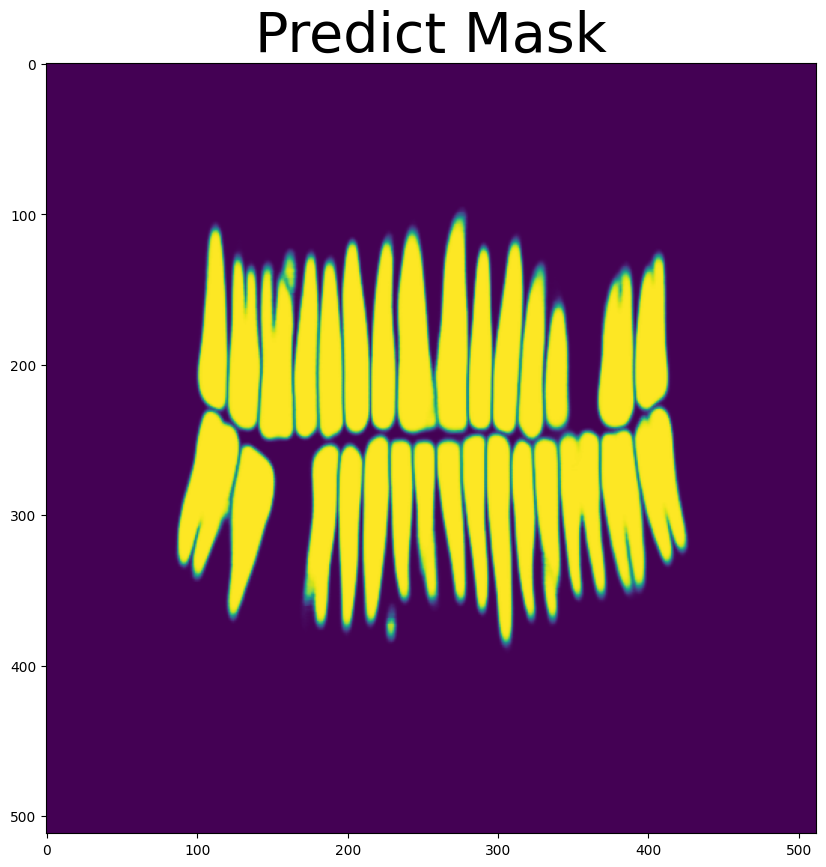

In [27]:
plt.figure(figsize = (20,10))
plt.title("Predict Mask",fontsize = 40)
plt.imshow(predict)
#For CCA, we saved
plt.imsave("/content/predict.png",predict)

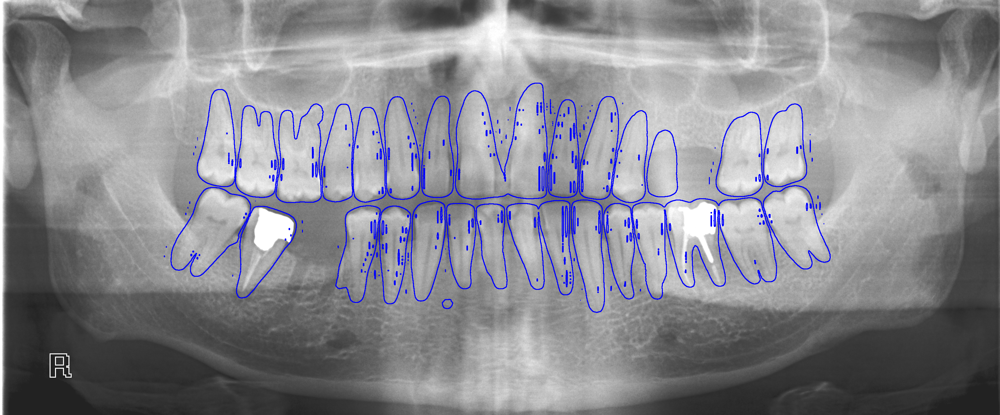

In [38]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("/content/drive/MyDrive/Images/107.png")#original img 107.png

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

mask=np.uint8(predict1*255)#
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts,hieararch=cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
# Convert img to cv2.UMat before drawing contours
img_umat = cv2.UMat(img)
# Draw contours on the UMat object, referencing the first channel using the .get() method to draw it on original image, not the copy
img_umat = cv2.drawContours(img_umat, cnts, -1, (255, 0, 0) , 2)

# Convert the UMat object back to a NumPy array for display
img = cv2.UMat.get(img_umat)

cv2_imshow(img)


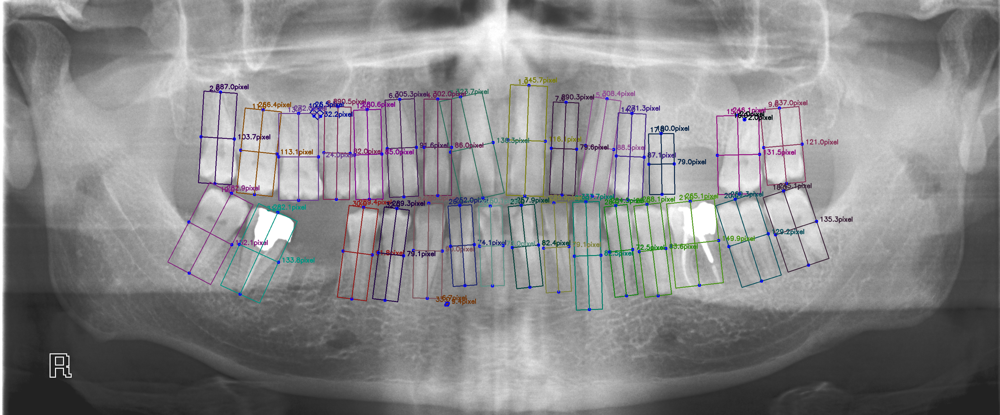

In [41]:
img=cv2.imread("/content/drive/MyDrive/Images/107.png")#original img 107.png

#load image (mask was saved by matplotlib.pyplot)
predicted=cv2.imread("/content/predict.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

cca_result,teeth_count=CCA_Analysis(img,predicted,3,2)
cv2_imshow(cca_result)


In [106]:
from PIL import Image
import numpy as np
import os

def convert_one_channel(img):
    return img[:, :, 0] if img.ndim == 3 else img

def preprocess_single_image(image_path, resize_shape=(512, 512), normalize=True):
    """
    Preprocess a single image to match dataset preprocessing:
    - Resize
    - Convert to grayscale if needed
    - Normalize to [0, 1]
    - Add batch and channel dimensions
    """
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")

    img = Image.open(image_path).convert("RGB")  # Ensure 3 channels
    original_size = img.size

    img = img.resize(resize_shape, Image.Resampling.LANCZOS)
    img = np.asarray(img)

    img = convert_one_channel(img)
    if normalize:
        img = img / 255.0

    img = np.expand_dims(img, axis=(0, -1))  # Shape: (1, H, W, 1)
    return img.astype(np.float32), original_size


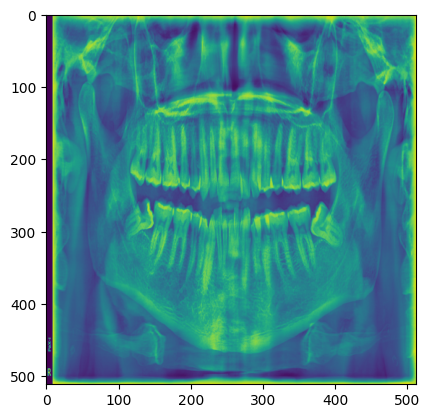

In [111]:
image_path = "/content/WhatsApp Image 2025-05-02 at 20.23.54_91c49726.jpg"  # replace with your file path
processed_image, original_size = preprocess_single_image(image_path)
plt.imshow(processed_image[0,:,:,0])

In [112]:
predict_img=model.predict(processed_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


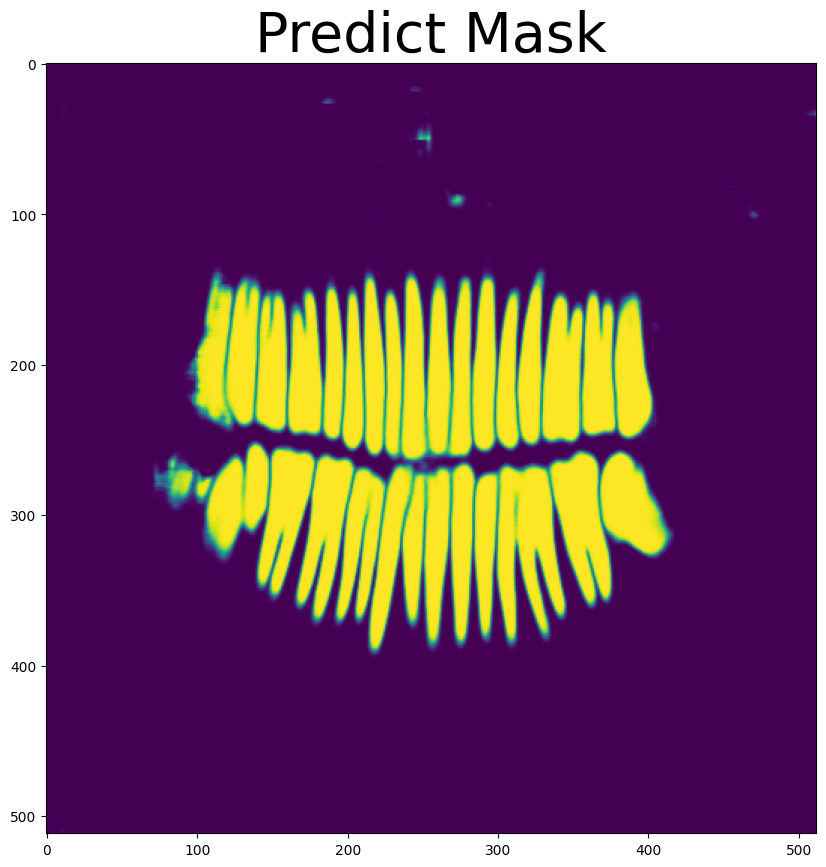

In [113]:
plt.figure(figsize = (20,10))
plt.title("Predict Mask",fontsize = 40)
queezed_img = predict_img[0, :, :, 0]
plt.imshow(queezed_img)
#For CCA, we saved
plt.imsave("/content/predict_img.png",queezed_img)

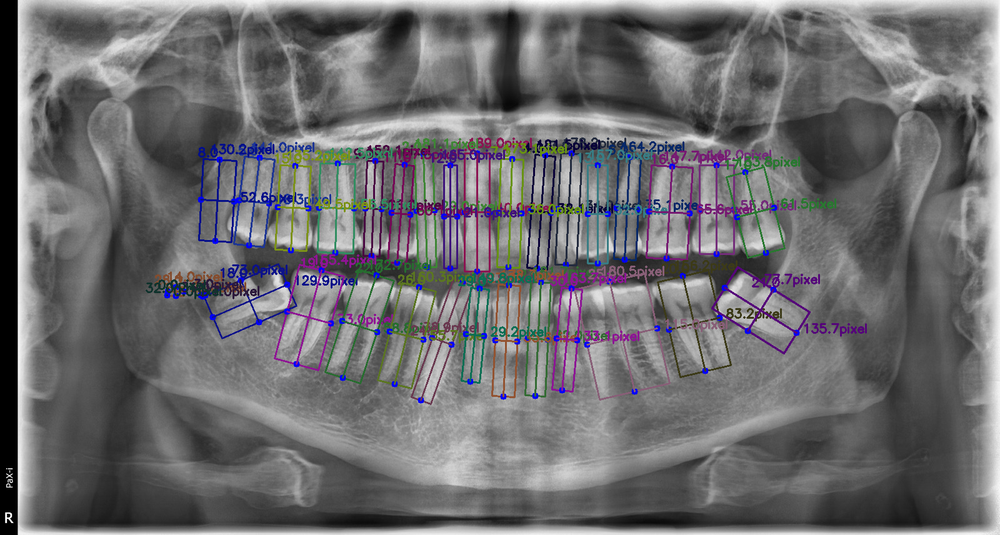

In [114]:
img=cv2.imread("/content/WhatsApp Image 2025-05-02 at 20.23.54_91c49726.jpg")#original img 107.png

#load image (mask was saved by matplotlib.pyplot)
predicted=cv2.imread("/content/predict_img.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

cca_result,teeth_count=CCA_Analysis(img,predicted,3,2)
cv2_imshow(cca_result)

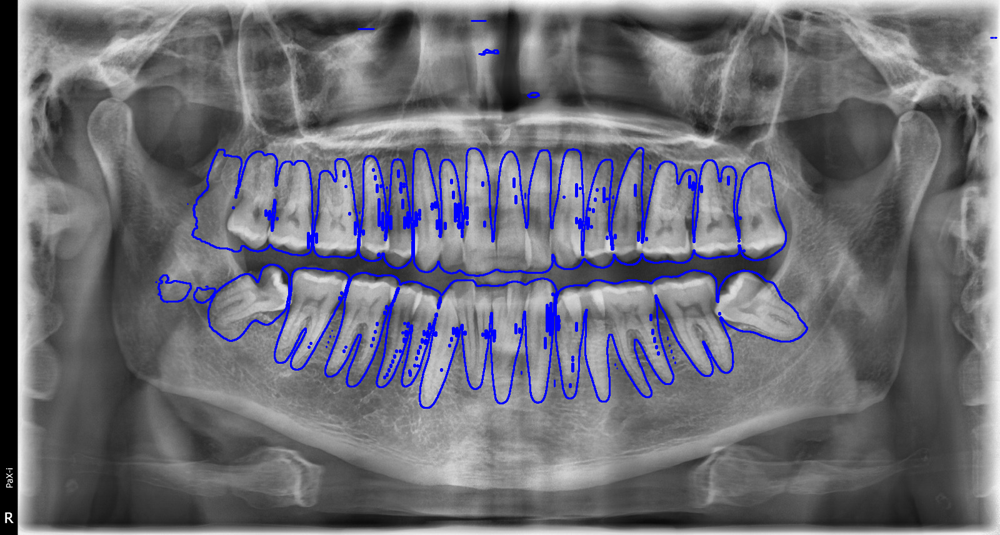

In [115]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("/content/WhatsApp Image 2025-05-02 at 20.23.54_91c49726.jpg")#original img 107.png

predict1 = cv2.resize(queezed_img, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

mask=np.uint8(predict1*255)#
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts,hieararch=cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
# Convert img to cv2.UMat before drawing contours
img_umat = cv2.UMat(img)
# Draw contours on the UMat object, referencing the first channel using the .get() method to draw it on original image, not the copy
img_umat = cv2.drawContours(img_umat, cnts, -1, (255, 0, 0) , 2)

# Convert the UMat object back to a NumPy array for display
img = cv2.UMat.get(img_umat)

cv2_imshow(img)